# Assignment: Generating Synthetic Faces using DCGAN

Step 1: Setup

In [ ]:
# !unzip -q "/content/drive/MyDrive/dataset/face.zip"

In [ ]:
import os
import torch
from torch import nn
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

image_size = 64
batch_size = 128
nz = 100  # Latent vector size
device

device(type='cuda')

Step 2: Load Dataset

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np

transform = transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

dataset = datasets.ImageFolder(
    root='/content/dataset/train',
    transform=transform
)

dataloader = DataLoader(dataset, batch_size=16, shuffle=True)
class_names = dataset.classes


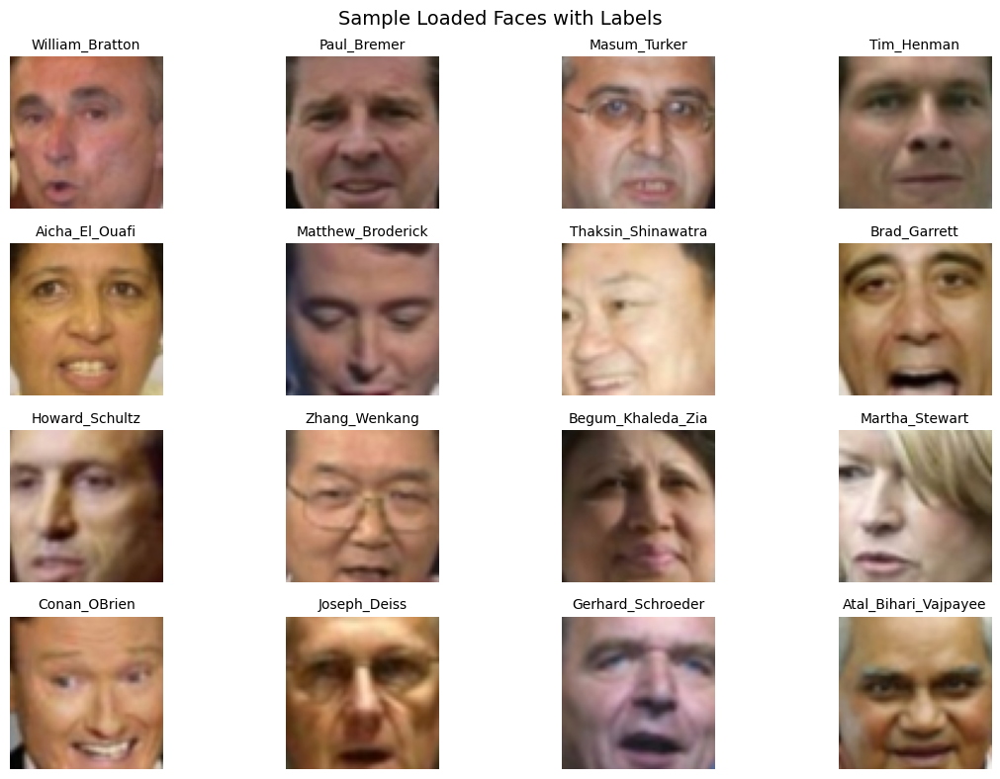

In [ ]:
import matplotlib.pyplot as plt
import torchvision
import numpy as np

# Get one batch of data
dataiter = iter(dataloader)
images, labels = next(dataiter)

# Unnormalize images from [-1,1] to [0,1]
images = images * 0.5 + 0.5

# Number of images to show
num_images = min(len(images), 16)

plt.figure(figsize=(12, 8))
for idx in range(num_images):
    img = images[idx].numpy()
    img = np.transpose(img, (1, 2, 0))  # CxHxW → HxWxC
    label = class_names[labels[idx]]

    plt.subplot(4, 4, idx+1)
    plt.imshow(img)
    plt.title(label, fontsize=10)
    plt.axis('off')

plt.suptitle("Sample Loaded Faces with Labels", fontsize=14)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()


Step 3: DCGAN Architecture

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.main(x).view(-1)


Step 4: Training Loop

In [ ]:
# Define models
netG = Generator().to(device)
netG.apply(weights_init)

netD = Discriminator().to(device)
netD.apply(weights_init)

# Loss function
criterion = nn.BCELoss()

# Optimizers
optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Fixed noise for visualizing generator progress
fixed_noise = torch.randn(64, nz, 1, 1, device=device)


Epoch 1/15 | Loss_D: 0.6265 | Loss_G: 3.7874


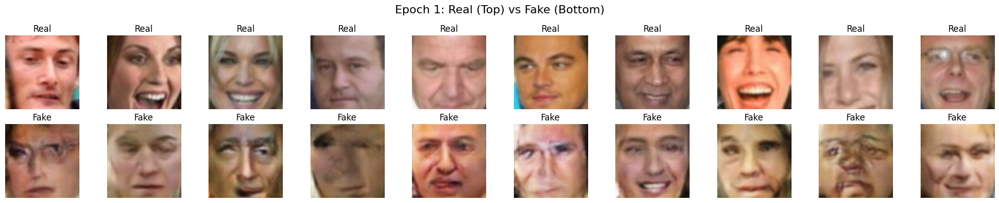

Epoch 2/15 | Loss_D: 0.5446 | Loss_G: 3.8515


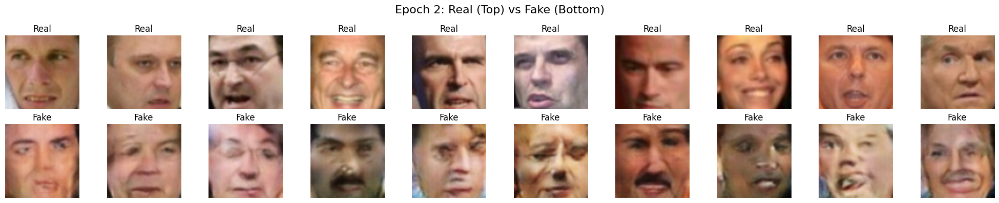

Epoch 3/15 | Loss_D: 0.5454 | Loss_G: 3.8946


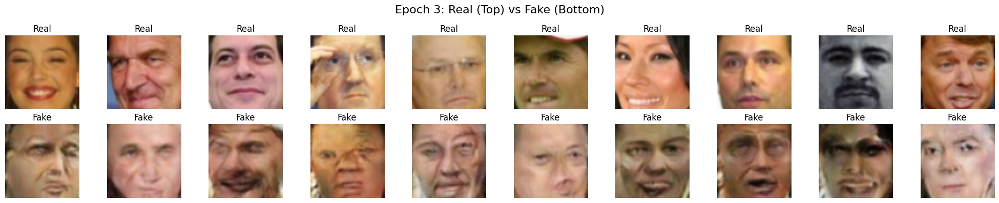

Epoch 4/15 | Loss_D: 0.5308 | Loss_G: 3.9314


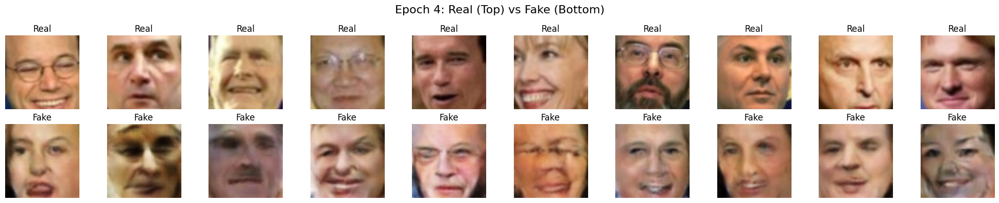

Epoch 5/15 | Loss_D: 0.5684 | Loss_G: 4.0169


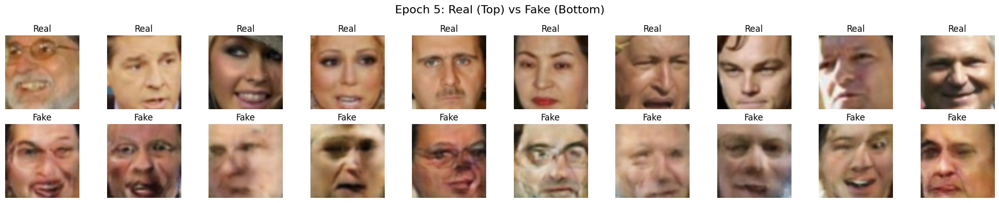

Epoch 6/15 | Loss_D: 0.5200 | Loss_G: 4.0237


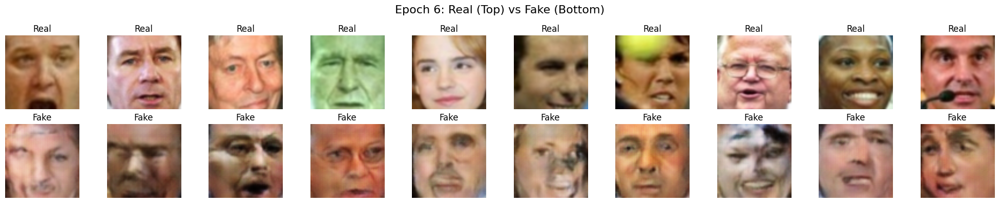

Epoch 7/15 | Loss_D: 0.4336 | Loss_G: 4.0487


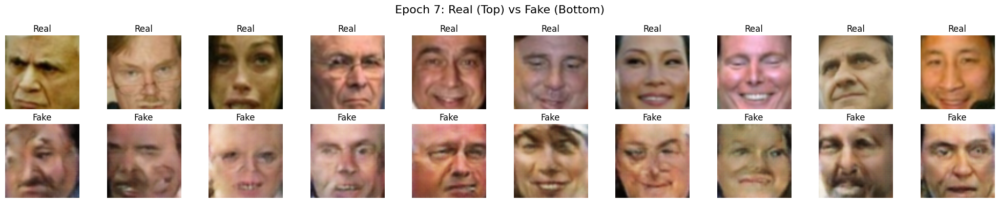

Epoch 8/15 | Loss_D: 0.4701 | Loss_G: 4.2945


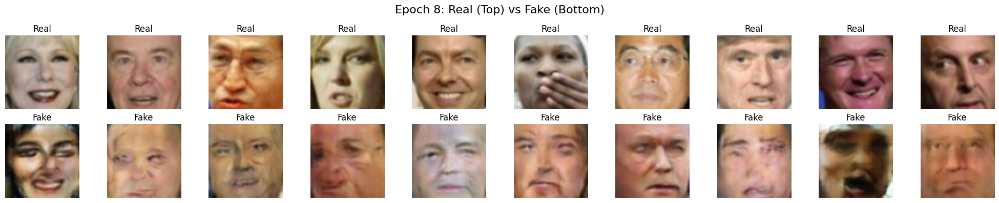

Epoch 9/15 | Loss_D: 0.4695 | Loss_G: 4.2996


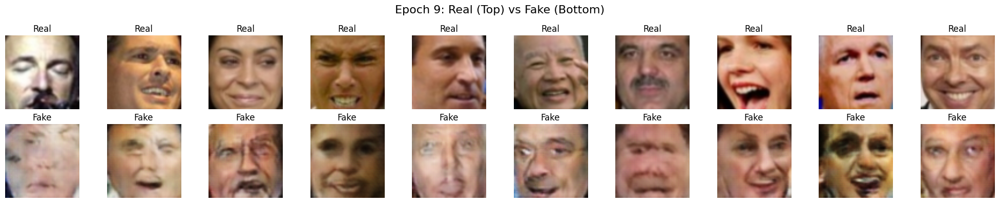

Epoch 10/15 | Loss_D: 0.4869 | Loss_G: 4.1925


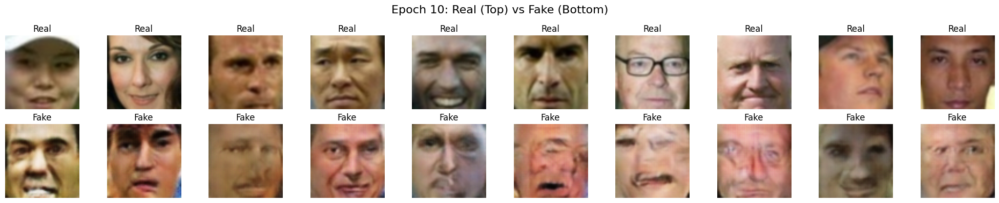

Epoch 11/15 | Loss_D: 0.4536 | Loss_G: 4.2765


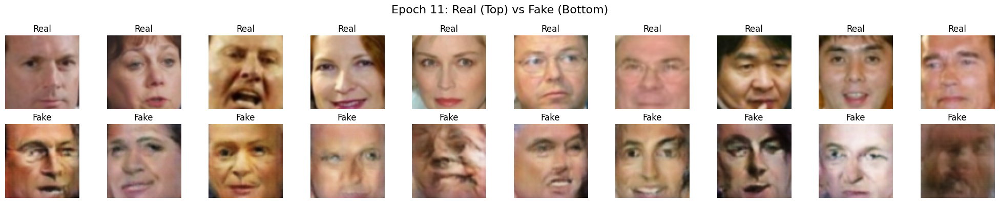

Epoch 12/15 | Loss_D: 0.4141 | Loss_G: 4.4188


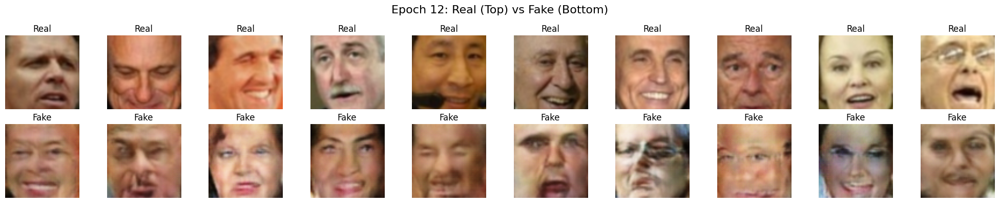

Epoch 13/15 | Loss_D: 0.4305 | Loss_G: 4.2944


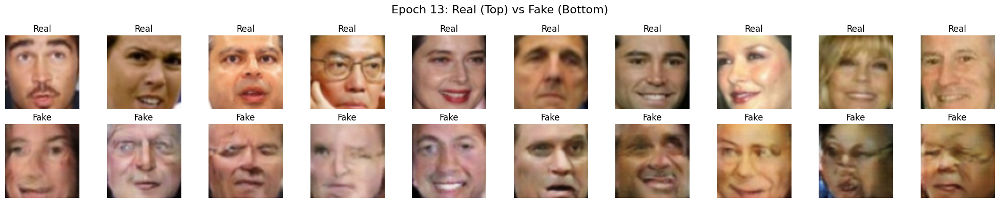

Epoch 14/15 | Loss_D: 0.4377 | Loss_G: 4.5142


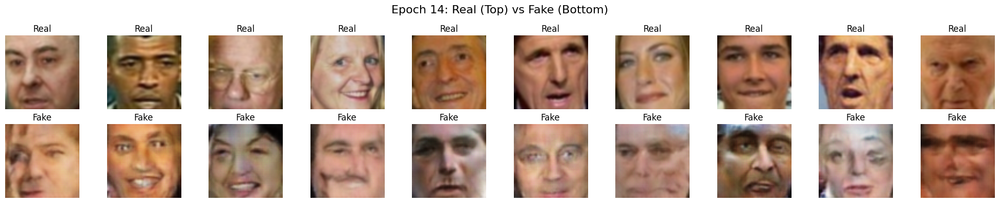

Epoch 15/15 | Loss_D: 0.3794 | Loss_G: 4.4550


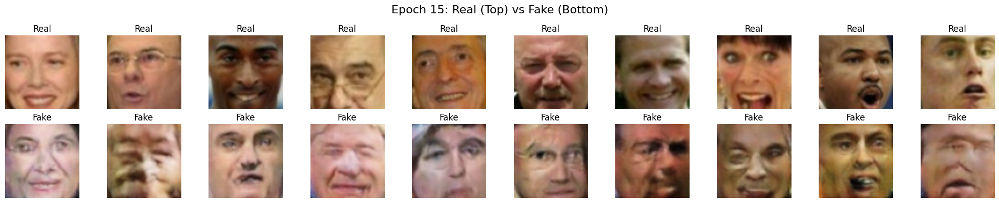

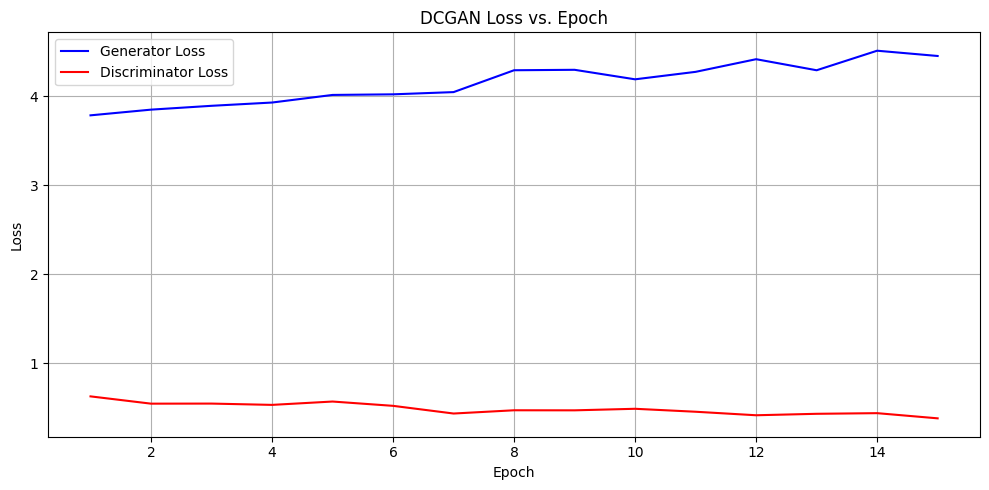

In [ ]:
num_epochs = 15
real_label = 1.
fake_label = 0.
G_losses = []
D_losses = []

best_g_loss = float("inf")
epochs_no_improve = 0
patience = 3
early_stop = False

for epoch in range(num_epochs):
    if early_stop:
        break

    G_epoch_loss = 0
    D_epoch_loss = 0
    batch_count = 0

    for i, (data, _) in enumerate(dataloader):
        real = data.to(device)
        b_size = real.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)

        # Train Discriminator with real images
        netD.zero_grad()
        output = netD(real)
        errD_real = criterion(output, label)
        errD_real.backward()

        # Train Discriminator with fake images
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach())
        errD_fake = criterion(output, label)
        errD_fake.backward()
        optimizerD.step()

        # Train Generator
        netG.zero_grad()
        label.fill_(real_label)
        output = netD(fake)
        errG = criterion(output, label)
        errG.backward()
        optimizerG.step()

        # Accumulate epoch losses
        G_epoch_loss += errG.item()
        D_epoch_loss += (errD_real + errD_fake).item()
        batch_count += 1

    # Compute average losses for the epoch
    avg_g_loss = G_epoch_loss / batch_count
    avg_d_loss = D_epoch_loss / batch_count
    G_losses.append(avg_g_loss)
    D_losses.append(avg_d_loss)

    print(f"Epoch {epoch+1}/{num_epochs} | Loss_D: {avg_d_loss:.4f} | Loss_G: {avg_g_loss:.4f}")

    # Show generated images
    # Show side-by-side: real vs fake (10 samples)
    with torch.no_grad():
        real_batch = next(iter(dataloader))[0][:10].to(device)
        fake_batch = netG(torch.randn(10, nz, 1, 1, device=device)).detach().cpu()
        real_batch = real_batch.cpu()

        plt.figure(figsize=(20, 4))
        for i in range(10):
            # Real image
            plt.subplot(2, 10, i + 1)
            img = real_batch[i] * 0.5 + 0.5  # unnormalize
            plt.imshow(np.transpose(img.numpy(), (1, 2, 0)))
            plt.axis("off")
            plt.title("Real")

            # Fake image
            plt.subplot(2, 10, i + 11)
            img = fake_batch[i] * 0.5 + 0.5  # unnormalize
            plt.imshow(np.transpose(img.numpy(), (1, 2, 0)))
            plt.axis("off")
            plt.title("Fake")

        plt.suptitle(f"Epoch {epoch+1}: Real (Top) vs Fake (Bottom)", fontsize=16)
        plt.tight_layout()
        plt.show()


    # Early stopping check
    # if avg_g_loss < best_g_loss:
    #     best_g_loss = avg_g_loss
    #     epochs_no_improve = 0
    # else:
    #     epochs_no_improve += 1
    #     if epochs_no_improve >= patience:
    #         print(f"Early stopping triggered at epoch {epoch+1}")
    #         early_stop = True

# Plot Loss vs. Epoch
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(G_losses) + 1), G_losses, label='Generator Loss', color='blue')
plt.plot(range(1, len(D_losses) + 1), D_losses, label='Discriminator Loss', color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("DCGAN Loss vs. Epoch")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


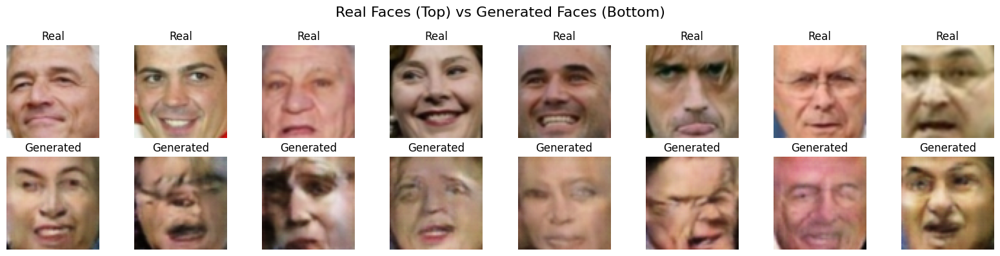

In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Get a batch of real images
real_batch = next(iter(dataloader))[0][:8]  # first 8 real images
real_batch = real_batch * 0.5 + 0.5  # Unnormalize to [0,1]

# Generate a batch of fake images
noise = torch.randn(8, nz, 1, 1, device=device)
with torch.no_grad():
    fake_batch = netG(noise).detach().cpu()
fake_batch = fake_batch * 0.5 + 0.5  # Unnormalize to [0,1]

# Plot side by side
plt.figure(figsize=(16, 4))
for i in range(8):
    # Real image
    plt.subplot(2, 8, i + 1)
    plt.imshow(np.transpose(real_batch[i].numpy(), (1, 2, 0)))
    plt.title("Real")
    plt.axis('off')

    # Fake image
    plt.subplot(2, 8, i + 9)
    plt.imshow(np.transpose(fake_batch[i].numpy(), (1, 2, 0)))
    plt.title("Generated")
    plt.axis('off')

plt.suptitle("Real Faces (Top) vs Generated Faces (Bottom)", fontsize=16)
plt.tight_layout()
plt.show()


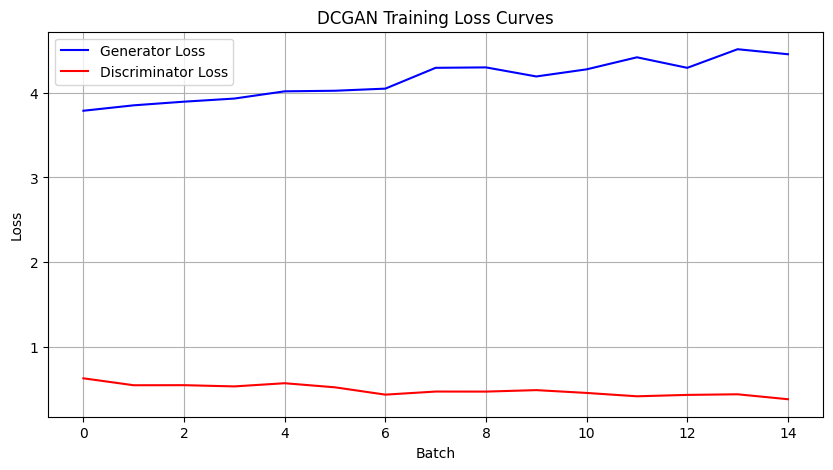

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(G_losses, label="Generator Loss", color='blue')
plt.plot(D_losses, label="Discriminator Loss", color='red')
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.title("DCGAN Training Loss Curves")
plt.legend()
plt.grid(True)
plt.show()


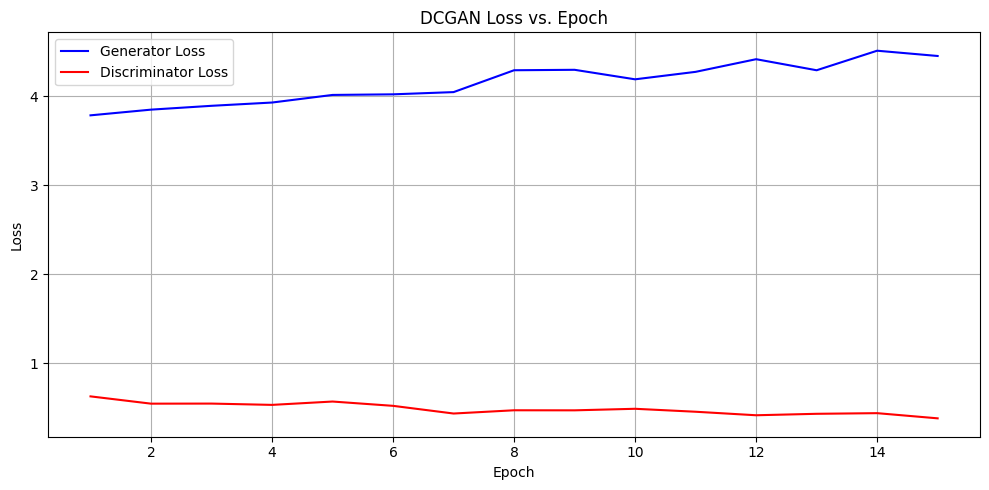

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(G_losses) + 1), G_losses, label='Generator Loss', color='blue')
plt.plot(range(1, len(D_losses) + 1), D_losses, label='Discriminator Loss', color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("DCGAN Loss vs. Epoch")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
